# Shiny Website with Dog API

**Team:** Joe Posthauer, Katie Wu, Ella Lehavi

**Audience:** Individuals with basic Python knowledge looking to learn web development and API calls on their own.

**External Libraries Used:** Dog API, Shiny for Python, Requests

**Vocabulary:** Web Development, Shiny, API, Front-end, back-end

## Introduction
In this tutorial, we will build a simple website with a dropdown menu that makes API calls to generate a random image of a dog from the selected breed. We will use [Shiny for Python](https://shiny.rstudio.com/py/) to build the website, and make calls to the [Dog API](https://dog.ceo/dog-api/). 

### Overview
In this tutorial, we will begin with an overview of Shiny and its user interface functions. We will then build a Shiny webpage with a dropdown menu that lists all dog breeds on the Dog API. Next, we will write a script that calls the Dog API. Finally, we will take our Shiny webpage and use the script we wrote to return images from the Dog API on our webpage.

Tutorial Outline:
- Introduction and Overview
- Background on Shiny
- Building Shiny Web App
- What is an API?
- Writing API Script
- Connecting the two
- Adding CSS

## What is Shiny?


[Shiny](https://shiny.rstudio.com/py/docs/overview.html) is a Python module that allows users to build web applications in Python. Shiny provides support for customizable layout and dynamic responses to events (like a button press or dropdown selection). 

##How do I use Shiny?

In this tutorial, you will be expected to write code written using Shiny. You will need to install Shiny locally and run the app through a terminal (just like how you have in CS5 - feel free to use the terminal on your computer or the built-in terminal in your code editor!). 

To install Shiny on your computer, you will need Python and pip installed on your machine. Then, you can just follow [these instructions](https://shiny.rstudio.com/py/docs/install.html). 


## Getting Started

Let's run a basic Shiny app! Note: this tutorial assumes that you are running Shiny locally. 

First, create a directory, `cd` into that directory, and run the following command from your terminal:

`shiny create .`


This creates a basic Shiny application named `app.py`. 

Your directory should now look like this: 
```
/directory_name
--> app.py 
--> /__pycache__
```

Your file should look like this: 
```python
from shiny import App, render, ui

app_ui = ui.page_fluid(
    ui.h2("Hello Shiny!"),
    ui.input_slider("n", "N", 0, 100, 20),
    ui.output_text_verbatim("txt"),
)


def server(input, output, session):
    @output
    @render.text
    def txt():
        return f"n*2 is {input.n() * 2}"


app = App(app_ui, server)
```

Now that we have a simple Shiny app set up, let's run the app! 

Run the following command in your terminal. 

In [ ]:
!shiny run --reload

You should now see an output similar to this one: 

```
INFO:     Will watch for changes in these directories: ['/Users/username/Desktop/shiny-tutorial-test']
INFO:     Uvicorn running on http://127.0.0.1:8000 (Press CTRL+C to quit)
INFO:     Started reloader process [53461] using StatReload
INFO:     Started server process [53463]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
```

Open the provided link in a web browser (likely http://127.0.0.1:8000) to access your web application! It should look like this: 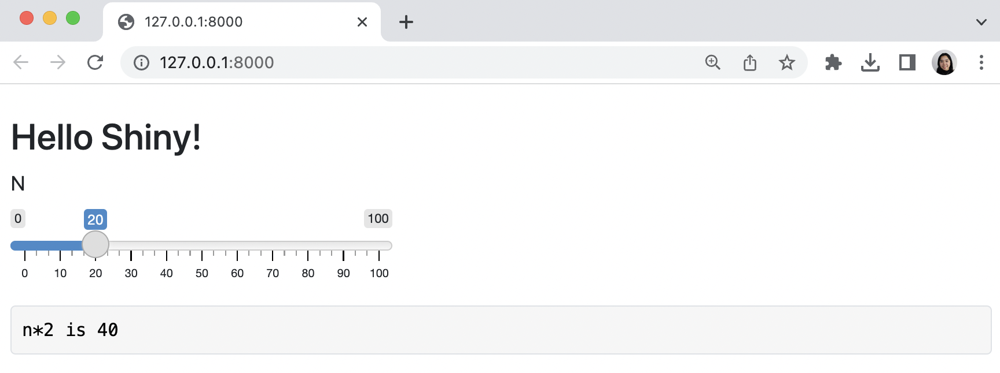

Now that the app is up and running, we will walk through the components of `app.py`.

### Imports

From `Shiny`, we import `App` and `ui`, which will enable us to define the user interface and create a Shiny App object that connects the user interface and Shiny server. 

In [ ]:
from shiny import App, render, ui

### User Interface

The user interface determines what components render on the page. In the following UI, there is an h2 component `ui.h2`, an input slider `ui.input_slider`, and an output text component `ui.output_text_verbatim`. You don't need to study these components in depth, but just know that each one corresponds to something that shows up on the user interface!  

Play around with commenting out any of the lines associated with the components (one at a time)! How does the page change? 

Additionally, notice that `output_text_verbatim` takes in the string "txt", but doesn't actually render the string "txt" on the page. This is because [the output function](https://shiny.rstudio.com/py/api/ui.output_text_verbatim.html) interprets "txt" as an *input id*. Thus, it renders a string corresponding to the return value of the `txt()` function found within the server function. 

In [ ]:
app_ui = ui.page_fluid(
    ui.h2("Hello Shiny!"),
    ui.input_slider("n", "N", 0, 100, 20),
    ui.output_text_verbatim("txt"),
)

### Server

The server contains the logic for what renders on the page. Notice that one of the components in the UI was `ui.output_text_verbatim("txt"),`. This corresponds to the `txt()` function in server, which returns the output for what renders in the output text component.

Additionally, the `txt()` function has two decorators (denoted by the `@`): 
* `@output`, to say the result should be displayed on the web page
* `@render.text`, to say the result is text (rather than an image or plot)

In [ ]:
def server(input, output, session):
    @output
    @render.text
    def txt():
        return f"n*2 is {input.n() * 2}"

### App 
Lastly, the App combines the UI and the server. 

In [ ]:
app = App(app_ui, server)

### Your Turn: Simple Dropdown Menu 
Next, we will modify the website to display a dropdown menu and print out the text selected from the dropdown menu by the user. 

Visit the [Shiny API documentation](https://shiny.rstudio.com/py/api/) and click through some of the functions listed on the left navigation menu. 

Since we want to display a dropdown menu that allows the user to select an option, this will be considered a *UI Input*. Locate the function `ui.input_select`. It is also linked [here](https://shiny.rstudio.com/py/api/ui.input_select.html). 

What are the **required** parameters for the function? 

Delete the input slider and add a line to the `app_ui` definition that creates a dropdown menu that has: 
* id: "fruit"
* label: "Select a fruit"
* four choices: an empty string, apple, banana, and orange. 

After modifying your UI, your website should look like this: 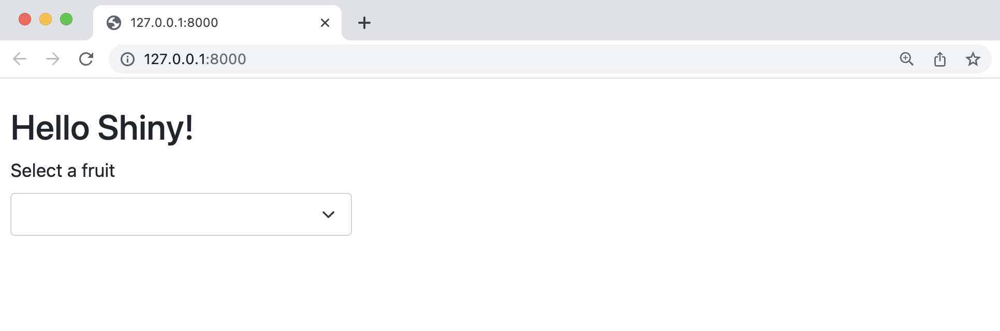

The dropdown should have the four choices that you included: 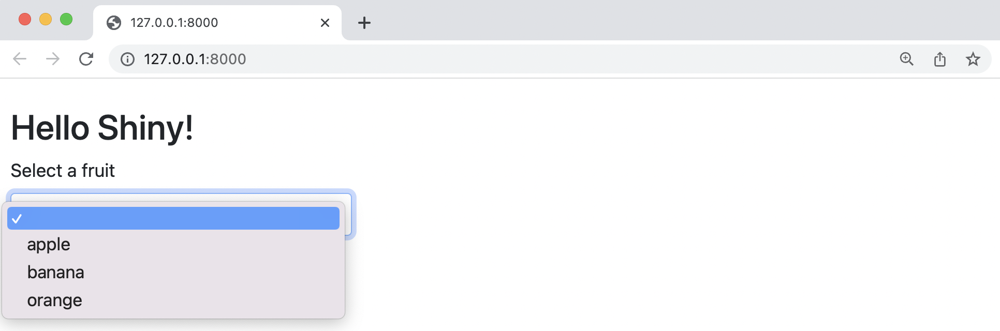

In [ ]:
# SOLUTION CODE - DON'T PEEK!
# The file app.py should look like this after the user adds their code

from shiny import App, render, ui

app_ui = ui.page_fluid(
    ui.h2("Hello Shiny!"),
    ui.input_select("fruit", "Select a fruit", ["", "apple", "banana", "orange"]),
    ui.output_text_verbatim("txt"),
)


def server(input, output, session):
    @output
    @render.text
    def txt():
        return f"n*2 is {input.n() * 2}"


app = App(app_ui, server)


Notice that the `output_text_verbatim` element is no longer rendering on the page, even though the code has not been deleted, because the `txt()` function tries to perform multiplication on `input.n()`, which no longer exists (since we deleted the input slider associated with `input.n()`). 

Next, let's change the `output_text_verbatim` component to display the text selected in the dropdown. We can do this by modifying the `return` statement in the `txt()` function within the server. Experiment with returning the input variable associated with the dropdown menu (hint: we assigned it an id in the previous task). 

You want your webpage to look like this after modifying the `txt()` function in the server:  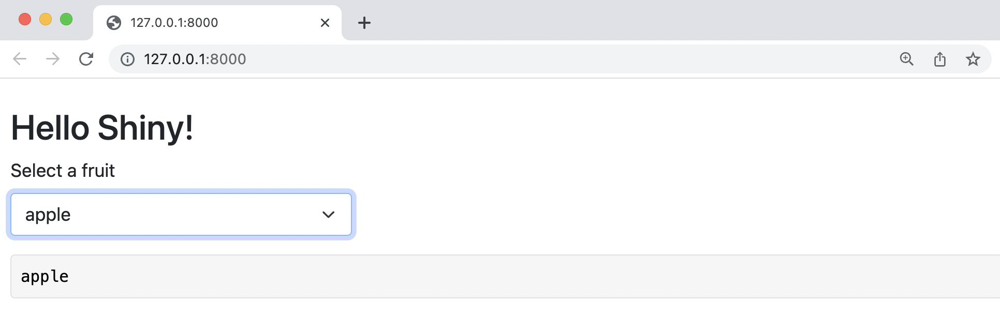

In [ ]:
# SOLUTION CODE - DON'T PEEK!
# The file app.py should look like this after the user adds their code

from shiny import App, render, ui

app_ui = ui.page_fluid(
    ui.h2("Hello Shiny!"),
    ui.input_select("fruit", "Select a fruit", ["", "apple", "banana", "orange"]),
    ui.output_text_verbatim("txt"),
)


def server(input, output, session):
    @output
    @render.text
    def txt():
        return f"{input.fruit()}"


app = App(app_ui, server)


Next, let's talk a bit about APIs! We'll revisit Shiny again at the end of this tutorial.

## APIs

### What is an API?


APIs, or Application Programming Interfaces, allow programmers to be able to access the features of an external service without implementing the service itself. For example, if you wanted to collect data from a site like Youtube and use it in your code, then you can utilize the Youtube API, which provides data from Youtube for its users. In this tutorial, we will explore API usage with a simple API, the [Dog API](https://dog.ceo/dog-api/documentation/).

### How do I use an API?

From local code, we can use *requests* to access elements of an API. It is important to note that requests are sent to a server where the API can be found; thus, API requests from local code only work with an internet connection. 

There are 4 main types of requests: GET, POST, PUT, and DELETE. Each of these requests roughly translates to (respectively) "Read", "Post", "Update/Replace", and "Delete". When working with APIs, combinations of these requests may prove useful; however, in this tutorial, we will only explore the GET request, which will fetch data from an API.

### Getting Started

We will explore API usage in a Python file. In the file directory that you worked with during the Shiny section of this tutorial, create a new file named `dog_api.py`. 

Your file directory should now look like: 

```
/directory_name
--> app.py 
--> dog_api.py
--> /__pycache__
```

Add the following import and function stub to your file:




In [ ]:
import requests

def random_dog_img(): 
  '''
  Calls the Dog API and returns the URL to a random dog image.
  '''
  return

Requests is a library built into Python that allows us to make HTTP (Hyper Text Transfer Protocol) requests. If this package is not already included with your version of Python, then type the following command into your terminal:

In [ ]:
!pip install requests

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Once requests is installed, we can officially make requests in our code.

### Exploring the Dog API

In order to properly understand how we can utilize an API, it is important to read its documentation. API calls vary from API to API, and so reading documentation allows us to become familiar with navigating the requests we can send.

Let's look at the Dog API documentation. Click on [this link](https://dog.ceo/dog-api/documentation/) to find the documentation. You should be brought to this page: 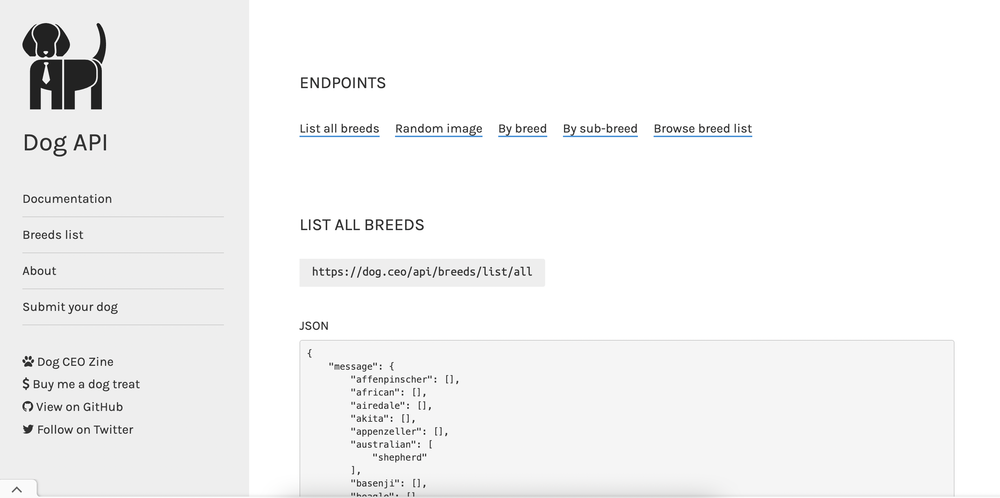

The Dog API is a simple API that provides users with images of dogs. We will explore this APIs documentation so that we understand how to utilize it to return a dog breed image for our app.

### Endpoints

An API endpoint is a way in which one can access certain aspects of an API. Often times, API endpoints are URLs, as is the case with the Dog API.

On this page, you can see a list of endpoints at the top, ranging from 'List all breeds' to 'Browse breed list'. We are currently on the 'List all breeds' documentation, as can be seen beneath the list of endpoints. The URL for this endpoint can be seen directly beneath the text 'Browse breed list'. We will utilize this URL in our code to access the data to the list of all dog breeds that the Dog API stores.

### JSON

Directly below the URL, we can see a section titled 'JSON'. JSON, or JavaScript Object Notation, is a data format that files are transferred in. Often, when requesting an API for data, the API will return a JSON object. In our case, we see that when we request the 'Browse breed list' endpoint, we are returned JSON with all of the available breeds that the API offers.

JSON is sectioned into a hierarchy, where data is accessed through accessing different JSON objects. In our case, we can see that the 'Browse breed list' request returns a JSON object with two sub-objects: "message" and "status". The object looks as following: 

```python
{
    "message": {
        "affenpinscher": [],
        "african": [],
        "airedale": [],
        "akita": [],
        "appenzeller": [],
        "australian": [
            "shepherd"
        ],
        "basenji": [],
        "beagle": [],
        "bluetick": [],
        "borzoi": [],
        "bouvier": [],
        "boxer": [],
        "brabancon": [],
        "briard": [],
        "buhund": [
            "norwegian"
        ],
        "bulldog": [
            "boston",
            "english",
            "french"
        ],
        ...
        "wolfhound": [
            "irish"
        ]
    },
    "status": "success"
}
```
Inside of the 'message' object are further sub-objects, each representing a breed, and its respective sub-objects representing sub-breeds. To access sub-objects, we use bracket notation similar to accessing an array. Supposed the JSON above was assigned to a variable named `json_response`. In order to print the breeds, we would use the following code: 

```python
# print the list of breeds
print(json_response['message'])
# print the list of subbreeds 
print(json_response['message']['bulldog'])
```

### Coding with APIs

Now that we have investigated the API documentation, we can write code to access information we want from the API. We will be utilizing a GET request, since we are only requesting data from the API ([click here if you want to learn more about the different API requests](https://www.techtarget.com/searchapparchitecture/tip/The-5-essential-HTTP-methods-in-RESTful-API-development)).

Let's code a GET request to access all of the breeds in the API. To do this, let's store the 'Browse breed list' URL as a variable, and then store our request as a variable called 'response'. Paste the code below into the `random_dog_img()` function. This code tells us that we are making a get request, and that we are requesting the json file with the list of all breeds.

In [ ]:
def random_dog_img(): 
  '''
  Calls the Dog API and returns the URL to a random dog image.
  '''
  all_breeds_url = 'https://dog.ceo/api/breeds/list/all'

  response = requests.request("GET", all_breeds_url)

  return response.json()['message']

print(random_dog_img())

{'affenpinscher': [], 'african': [], 'airedale': [], 'akita': [], 'appenzeller': [], 'australian': ['shepherd'], 'basenji': [], 'beagle': [], 'bluetick': [], 'borzoi': [], 'bouvier': [], 'boxer': [], 'brabancon': [], 'briard': [], 'buhund': ['norwegian'], 'bulldog': ['boston', 'english', 'french'], 'bullterrier': ['staffordshire'], 'cattledog': ['australian'], 'chihuahua': [], 'chow': [], 'clumber': [], 'cockapoo': [], 'collie': ['border'], 'coonhound': [], 'corgi': ['cardigan'], 'cotondetulear': [], 'dachshund': [], 'dalmatian': [], 'dane': ['great'], 'deerhound': ['scottish'], 'dhole': [], 'dingo': [], 'doberman': [], 'elkhound': ['norwegian'], 'entlebucher': [], 'eskimo': [], 'finnish': ['lapphund'], 'frise': ['bichon'], 'germanshepherd': [], 'greyhound': ['italian'], 'groenendael': [], 'havanese': [], 'hound': ['afghan', 'basset', 'blood', 'english', 'ibizan', 'plott', 'walker'], 'husky': [], 'keeshond': [], 'kelpie': [], 'komondor': [], 'kuvasz': [], 'labradoodle': [], 'labrador':

To run the code snippet, make sure you are in the correct directory in your terminal, then run:

In [ ]:
!python dog_api.py

You should see all of the breeds printed out in your terminal. Let's practice this again with a different endpoint: the 'Browse breed list' endpoint. 

We can see that the endpoint requires a specified breed, so let's choose one from the response from our terminal. The `dog_img_by_breed` function takes in the specified breed, and turns it into a url. We then make a GET request to the dog API with said url and return the response.  Add this function to the bottom of your file and run it. 

In [ ]:
def dog_img_by_breed(breed): 
  '''
  Calls the Dog API and returns the URL to a dog corresponding to a specific breed
  '''
  random_breed_url = "https://dog.ceo/api/breed/"+breed+"/images/random"

  response = requests.request("GET", random_breed_url)

  return response.json()["message"]

#choose rottweiler for example
breed = 'rottweiler'
print(dog_img_by_breed(breed))

https://images.dog.ceo/breeds/rottweiler/n02106550_5252.jpg


This function takes in a specified breed and adds it to our request. You can see that in this case, the response returns a URL. You can click on this URL in your terminal, and find a photo of the dog breed you specified!

### Final API Code

Now that we are familiar with accessing elements of the Dog API, let's work through the final code we will need for the app. 

We will need three functions: `get_breeds`, `url`, and `get_link`.

`get_breeds` sends a GET request to the dog API, and creates a list of breeds from the resulting JSON that we can use for our dropdown.

`url` similarly to `dog_img_by_breed` takes in a breed and returns a url to the Dog API with said breed. Unlike `dog_img_by_breed`, `url` does not make an API call and only returns the URL.

`get_link` takes in a URL, makes a GET request to the URL and returns the response.

The following code snippet is an example of what the code in the `dog_api.py` file should look like in the end.

In [ ]:
import requests

def get_breeds():
    '''
    Calls the Dog API and a list of all breeds 
    '''
    url = 'https://dog.ceo/api/breeds/list/all'
    response = requests.request("GET", url)
    return [breed for breed in response.json()["message"]]

def url(breed):
    '''
    Returns a URL that can be used to make a call to the Dog API to request a random image for a specific breed
    '''
    return f"https://dog.ceo/api/breed/{breed}/images/random"

def get_link(url):
    '''
    Makes a call to the Dog API for a specific URL and returns the response (a link to a dog image)
    '''
    response = requests.request("GET", url)

    return response.json()["message"]

print(get_link(url('affenpinscher')))

https://images.dog.ceo/breeds/affenpinscher/n02110627_4086.jpg


This is just a more formal formatting for the code we have written previously. As can be seen, API calls can happen within functions, and so do not have to only be in a script format.

## Connecting API and Shiny 

### Final Product Review

Our final app that we will create generates a dog image given a user-chosen breed. So, in this section, we will learn how to connect the code files we have been working on for a fully functioning app. 

Remember where we left off in the Shiny introduction:  your `app.py` should look as follows.

```python
from shiny import App, render, ui

app_ui = ui.page_fluid(
    ui.h2("Hello Shiny!"),
    ui.input_select("fruit", "Select a fruit", ["", "apple", "banana", "orange"]),
    ui.output_text_verbatim("txt"),
)


def server(input, output, session):
    @output
    @render.text
    def txt():
        return f"{input.fruit()}"


app = App(app_ui, server)

```


## Connecting Files

In order to get the functionality from our API script to our Shiny app, we must import the script into our Shiny file. This way, our API script acts as a module, so we will have access to its functions. Add the following line of code to the top of your shiny file.

In [ ]:
import dog_api

This line of code communicates that we want to include aspects of the file, 'dog_api.py', into our Shiny file. This line assumes that the Shiny file is at the same level of the dog_api file, so ensure that your Shiny file and dog_api.py file are located in the same directory.

Importing a local file will give us access to that file's definitions and statements. Therefore, we will be able to call functions from dog_api.py in our Shiny file. The syntax for this is as follows:

In [ ]:
dog_api.get_breeds()

### Your Turn: Updating the Dropdown Menu! 

Let's modify the `app_ui` as follows: 
* Update the `h2` component to display the text: "This webpage generates pictures of dogs!"
* Update the `input_select` element to have id "breed", label "Select input", and the choices be a list of: empty string, "random, and the breeds returned by `dog_api.get_breeds()`

After making these edits, your web application should look as follows: 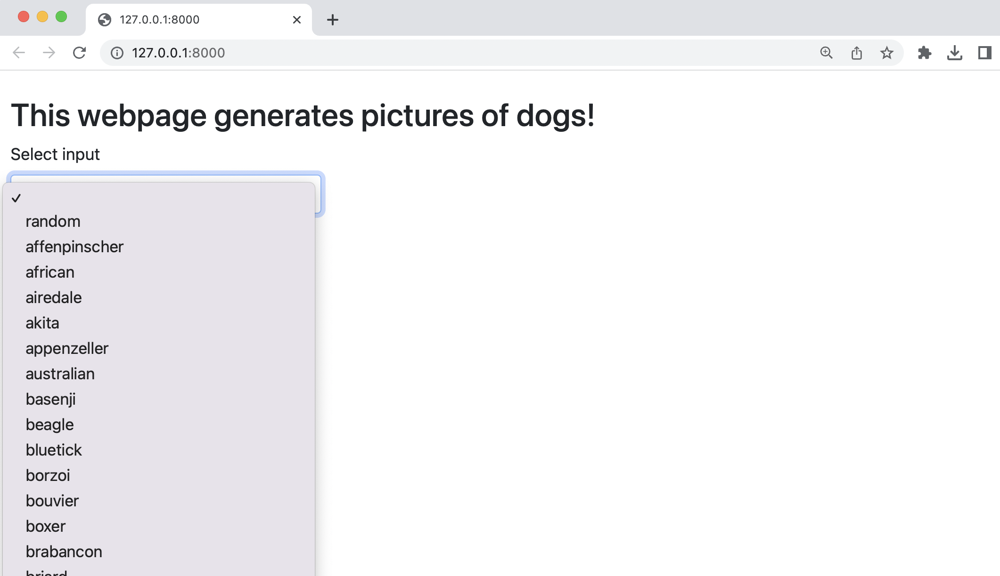


In [ ]:
# SOLUTION CODE - DON'T PEEK!
# The file app.py should look like this after the user adds their code 

from shiny import App, render, ui
import dog_api

app_ui = ui.page_fluid(
    ui.h2("This webpage generates pictures of dogs!"),
    ui.input_select("breed", "Select input", ["","random"] + dog_api.get_breeds()),
    ui.output_text_verbatim("txt"),
)


def server(input, output, session):
    @output
    @render.text
    def txt():
        return f"{input.fruit()}"


app = App(app_ui, server)

Next, let's add an `ui.output_ui` component that returns an image. Let's refer back to Shiny documentation: [here](https://shiny.rstudio.com/py/api/ui.output_ui.html) is the reference for the output UI component. Replace the `output_text_verbatim` component with the following line of code:

In [ ]:
ui.output_ui("generated_image"),

Now, we need to define `generated_image()` in the server. Delete the `txt()` function and add a function stub for `generated_image()`. It should have the following decorators: 
* `@output`
* `@render.ui` (since the function is now returning a UI element rather than text). 

Inside the function, have it return a `ui.img()` object. You may use the following line of code: 

In [ ]:
ui.img(src=dog_api.get_link("https://images.dog.ceo/breeds/pitbull/20190801_154956.jpg"), width="60%")


At this point, the web application should be displaying the image that we added: 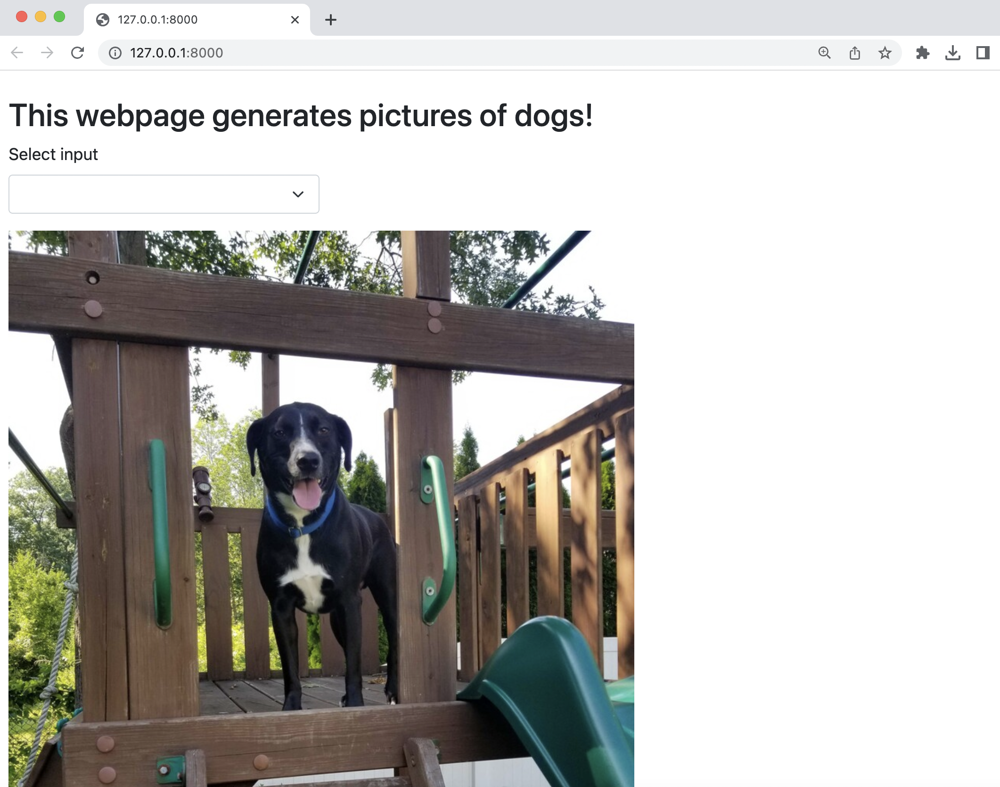

In [ ]:
# SOLUTION CODE - DON'T PEEK!
# The file app.py should look like this after the user adds their code
from shiny import App, render, ui
import dog_api

app_ui = ui.page_fluid(
    ui.h2("This webpage generates pictures of dogs!"),
    ui.input_select("breed", "Select input", ["","random"] + dog_api.get_breeds()),
    ui.output_ui("generated_image"),
)


def server(input, output, session):
    @output
    @render.ui
    def generated_image():
        return ui.img(src="https://images.dog.ceo/breeds/pitbull/20190801_154956.jpg", width="60%")
       

app = App(app_ui, server)


Let's improve our `generated_image()` function! Add the following logic: 
* if the input breed is an empty string, then just return 
* if the input breed is "random", then return an image of a random dog (using the `dog_api.get_link` function)
* if the input breed is a specific dog breed, then return an image of a dog of that breed (using the `dog_api.url` function) 

If correctly implemented, the webpage should be able to render images corresponding to the logic implemented in `generated_image()`. 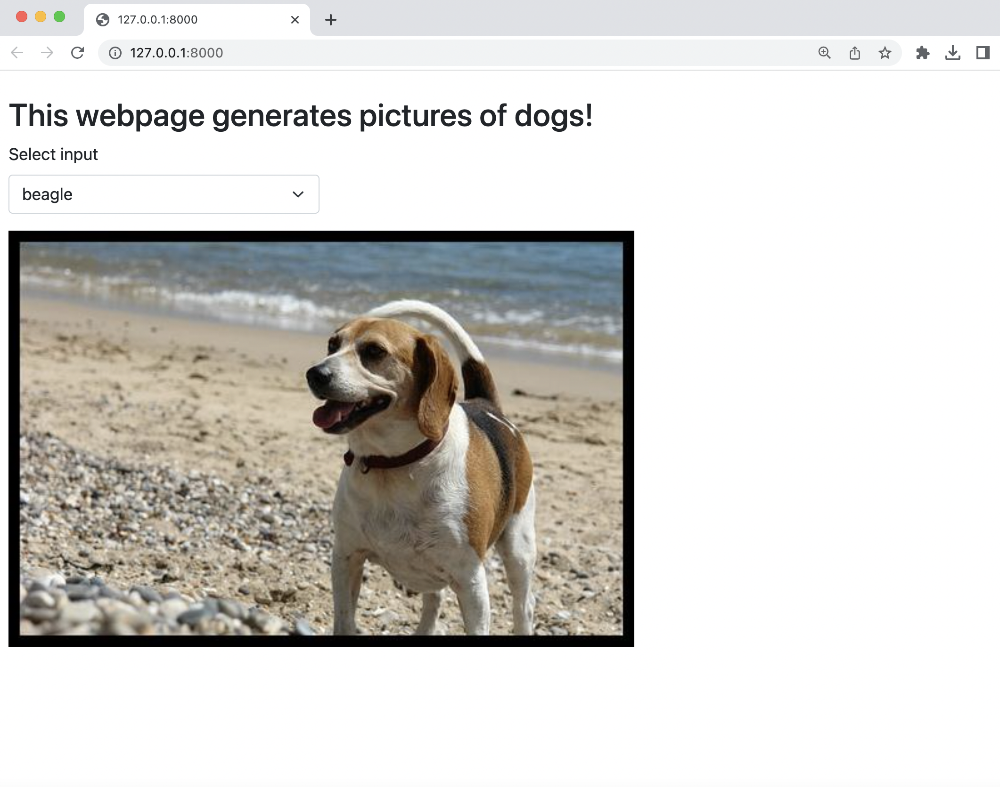

In [ ]:
# SOLUTION CODE - DON'T PEEK!
# The file app.py should look like this after the user adds their code

from shiny import App, render, ui
import dog_api

app_ui = ui.page_fluid(
    ui.h2("This webpage generates pictures of dogs!"),
    ui.input_select("breed", "Select input", ["","random"] + dog_api.get_breeds()),
    ui.output_ui("generated_image"),
)


def server(input, output, session):
    @output
    @render.ui
    def generated_image():
        if input.breed() == "": 
            return
        if input.breed() == "random": 
            return ui.img(src=dog_api.get_link("https://dog.ceo/api/breeds/image/random"), width="60%")
        else: 
            return ui.img(src=dog_api.get_link(dog_api.url(input.breed())), width="60%")


app = App(app_ui, server)

Lastly, let's add a "Generate" button so that the images will update every time the button is clicked! 

Add the following line to `app_ui` so that the button is between the dropdown menu and the output image: 

In [ ]:
ui.input_action_button("generate", "Generate!"),

Then, let's update the Shiny import to include `reactive`. Your import should now look like:

In [ ]:
from shiny import App, render, ui, reactive

Then, let's add a decorator to `generated_image()` to inform the function that it should be "reactive" to the button we created. This means that the UI component associated to `generated_image()` will re-render every time the button is clicked. 

We use the following decorator: 

In [ ]:
@reactive.event(input.generate)

Now, your website should look like this, and every time the generate button is clicked, a new image should appear: 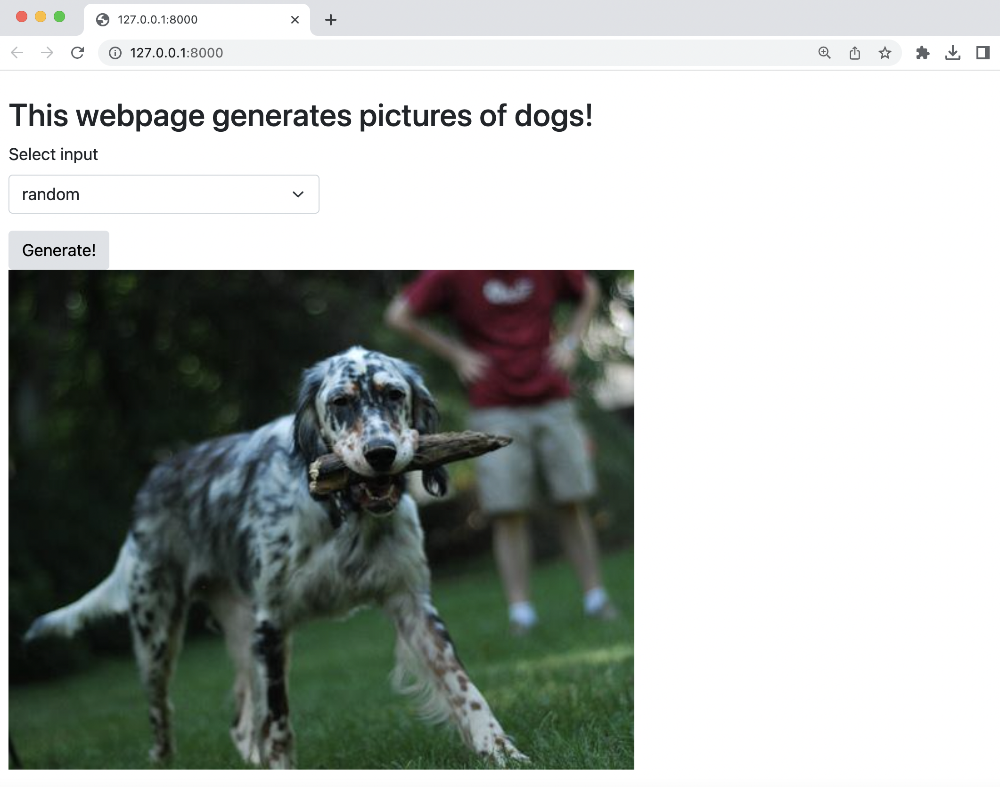

In [ ]:
# SOLUTION CODE - DON'T PEEK!
# The file app.py should look like this after the user adds their code

from shiny import App, render, ui, reactive
import dog_api

app_ui = ui.page_fluid(
    ui.h2("This webpage generates pictures of dogs!"),
    ui.input_select("breed", "Select input", ["","random"] + dog_api.get_breeds()),
    ui.input_action_button("generate", "Generate!"),
    ui.output_ui("generated_image"),
)


def server(input, output, session):
    @output
    @render.ui
    @reactive.event(input.generate)
    def generated_image():
        if input.breed() == "": 
            return
        if input.breed() == "random": 
            return ui.img(src=dog_api.get_link("https://dog.ceo/api/breeds/image/random"), width="60%")
        else: 
            return ui.img(src=dog_api.get_link(dog_api.url(input.breed())), width="60%")


app = App(app_ui, server)

## Styling the App

Though we have a fully functioning app, it would be nice to make it look more appealing to a user. To do this, we can utilize CSS, or cascading style sheets, to help the appearance of our app.

CSS is the language we use for styling web pages. Though conventionally it is used to style HTML (Hyper Text Markup Language) elements, we can still utilize it with Shiny to make the elements we have implemented look more appealing. We will go over CSS syntax as we go.

Let's add some CSS to our existing code. To do this, we will use inline CSS styling and styling that applies to all of our elements. 

### Styling All Elements

Currently, our app is a little dull and looks more like a standard word document than a fleshed-out application. To make it look more appealing, similar to a word document, we can change aspects of the elements we have on screen to a position/style that is much more appealing to the eye. This can include altering aspects such as coloring, font, positioning, and much more. 

To change aspects of all of our elements, we need to add CSS to the "head" tag of our Shiny app. To do this, let's find the proper place to out our code; locate the block of code towards the top of our Shiny file that starts with:


In [ ]:
app_ui = ui.page_fluid(

In this block, we input all of our Shiny elements. We will add one more at the very top of our elements. Paste this code snippet right below the line we just located: 

In [ ]:
ui.tags.head(
        ui.tags.style("""
            @import url('https://fonts.googleapis.com/css2?family=Poppins:wght@400;700&display=swap');
            * {
                font-family: 'Poppins', sans-serif;
                font-size: 2rem;
                background-color: #fbf2d5;
                margin: auto;
                text-align: center;
                padding: 0;

            }
       """)
),

This is a large block of code, so let's disect it bit by bit.

Starting from the top, we can see we want to access the tag called "head". In standard HTML documents, this is where we would import CSS styling, so similarly, we put our CSS in our Shiny tag called "head". Right below, we access the tag called "styling" to import our styles.

Right below, you can see we import a long URL. CSS does not actually come built in with many fonts, so to use unqiue fonts, we must import them (in this case, from the [google api](https://developers.google.com/fonts)).

Below this line, we see the start of a block of code beginning with "*". In this context, "*" refers to all elements we have on our webpage. This is common with CSS, and can be utilized [in many different ways to access all elements of similar types](https://www.geeksforgeeks.org/what-is-the-use-of-asterisk-selector-in-css/).

Now that we are accessing all elements in this block of code, then every line will apply to all of our elements. Let's see what each line does.

## Styling Lines



*   font-family: 'Poppins', sans-serif;

This line will change our fonts to specifically "Poppins", without serifs.

*   font-size: 2rem;

Here we set the font size. "rem" is a unit of measure proportional to the size of a user's screen, so our app's font size will auto adjust to different screen sizes.

*   background-color: #fbf2d5;

Colors in CSS are encoded in [hexidecimal](https://marketing.istockphoto.com/blog/hex-colors-guide/#:~:text=What%20is%20a%20hex%20color%20code%3F&text=A%20hex%20color%20code%20is,value%20from%200%20to%20255.&text=The%20code%20is%20written%20using,unique%202%2Ddigit%20alphanumeric%20code.). Here, we set it the background of our app to a light yellow, rather than the previous white. 

*   margin: auto;

"Margin" refers to the space outside or "around" or elements. The greater the margin, the greater the space outside our elements, thus making elements looking more spaced out. Setting our margin to "auto" is actually a sneaky trick used to center elements. Since we let the browser automatically set the left and right margin, our elements will align in the middle.

*   text-align: center;

Instead of our elements aligining in the middle, this lets our text align in the middle of their blocks. This is very similar to the middle align function in Word or Docs.

*   padding: 0;

If margin is external spacing, then padding is best described as internal spacing. Here we just set it to 0 to let our elements take up as much space as they can in their blocks.

## Inline Styling/Styling Specific Elements

Our web page looks a lot better now, though it could still improve. Let's style elements individually. To do this, we will add styling to the same line of the element declaration. 

Change the `ui.h2` line to the following:


In [ ]:
ui.h2("This webpage generates pictures of dogs!", style="background-color: #7fa99b; width: 100%; padding-bottom: 5px;"),

Here, we added a new background color, paddind and a width alteration to the title of our app. Let's do the same with the other elements. Change the following three element lines to this:

In [ ]:
ui.input_select("breed", "Select breed", ["","random"] + dog_api.get_breeds(), width='50%'),
ui.input_action_button("generate", "Generate!", style="width:50%; background-color: #7fa99b"),
ui.output_ui("generated_image", style="margin-top: 15px; margin-bottom: 30px; display: block; margin-left: auto; margin-right: auto; width: 40%;"),

Here again, we add styling to specific elements. This, syntactically, is called inline styling. It can be very useful when you want to make small stylistic changes to specific elements of a web app. Once you have posted the code, the entire "app_ui = ui.page_fluid(" block should look like the following:

In [ ]:
app_ui = ui.page_fluid(
    ui.tags.head(
        ui.tags.style("""
            @import url('https://fonts.googleapis.com/css2?family=Poppins:wght@400;700&display=swap');
            * {
                font-family: 'Poppins', sans-serif;
                font-size: 2rem;
                background-color: #fbf2d5;
                margin: auto;
                text-align: center;
                padding: 0;

            }
        """)
    ),
    ui.h2("This webpage generates pictures of dogs!", style="background-color: #7fa99b; width: 100%; padding-bottom: 5px;"),
    ui.input_select("breed", "Select breed", ["","random"] + dog_api.get_breeds(), width='50%'),
    ui.input_action_button("generate", "Generate!", style="width:50%; background-color: #7fa99b"),
    ui.output_ui("generated_image", style="margin-top: 15px; margin-bottom: 30px; display: block; margin-left: auto; margin-right: auto; width: 40%;"),
)

And, once you refresh the application, your app should look like the following:


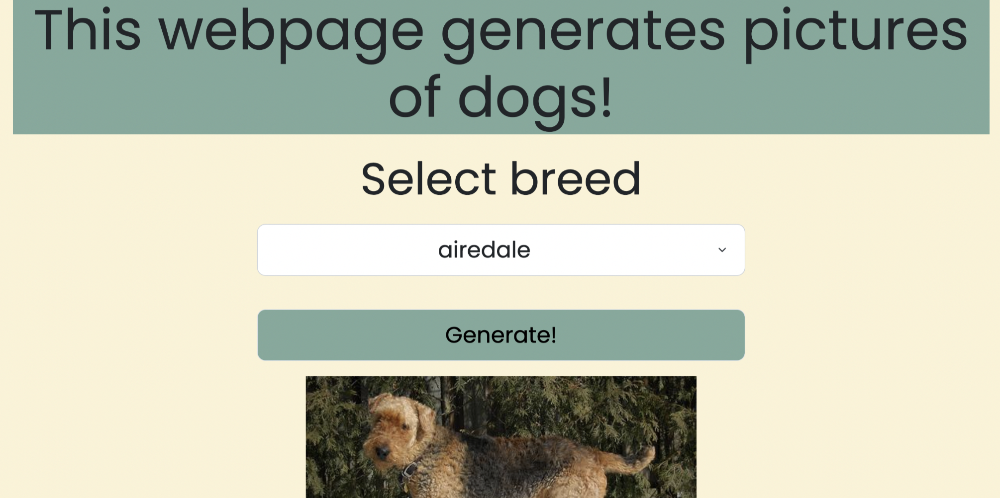


### That's all for this tutorial!

Congrats! You've successfully: learned about Shiny, used the `requests` Python module, and  created a web application that takes in user input and calls an API. Bravo! 